## Task: Measuring the size of a heated component

This task focuses on utilizing a combination of data from a regular RGB camera and a thermal camera for measuring the size of a heated component. As the heated component, the **Raspberry Pi 2 (Model B)** device was used together with **parasitic 2A resistors** connected via USB.

![Heated Component](images/vv.png)

### Import of libraries

In [ ]:
import os
import io

import cv2
import numpy as np
import matplotlib.pyplot as plt

from improutils import *
from scipy.spatial import distance

%matplotlib inline
np.set_printoptions(formatter={'float': lambda x: "{0:0.3f}".format(x)})

/shared-libs/python3.8/py/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


### Helper functions

In [ ]:
def normalized_image(img):
    '''
    Normalize an image.
    '''
    scaled = np.zeros_like(img)
    cv2.normalize(img, scaled, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX)
    return scaled.astype('uint8')

def to_3_channels(image_one_channel):
    '''
    Converts a single-channel image to a three-channel image. 
    The goal is, for example, to add the capability to draw or combine multiple three-channel images into a black and white image.
    '''
    h,w = image_one_channel.shape
    image3 = np.zeros((h,w,3), dtype=np.uint8)
    image3[:,:,0] = image_one_channel
    image3[:,:,1] = image_one_channel
    image3[:,:,2] = image_one_channel
    return image3

def load_termo_csv(file_path):
    '''
    Load data from a text file into a numpy matrix. The text data is separated by a semicolon (;) character.
    '''
    return np.genfromtxt(file_path, delimiter=';')[:, :-1]

Load image data in `png` format and temperature data in `csv` format. Normalize the temperature data so that it can be plotted.

In [ ]:
img = load_image("data/data_rgb.png")
temps = load_termo_csv("data/data_temps.csv")

normalized_temps = normalized_image(temps)

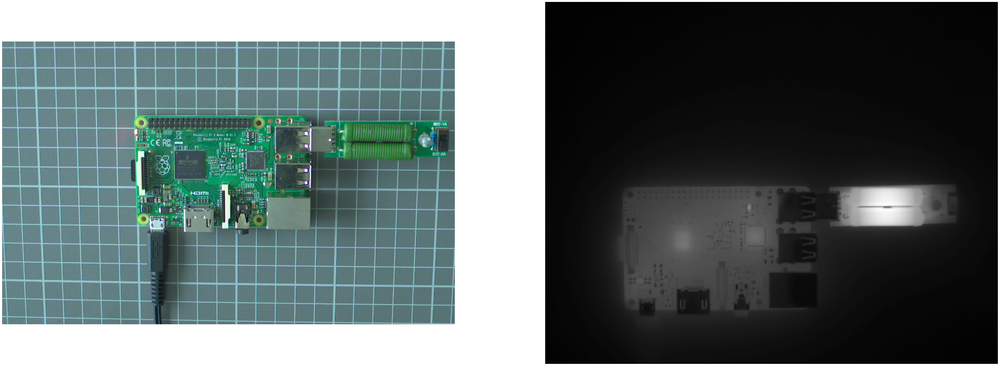

In [ ]:
plot_images(img, normalized_temps)

In [ ]:
print(f"Resolution of an image from a thermal camera: {temps.shape}")

Resolution of an image from a thermal camera: (512, 640)


Look at some statisticks about an image from a thermal camera.

In [ ]:
print(np.max(temps))
print(np.min(temps))
print(np.mean(temps))

68.1
28.4
32.09130798339844


In [ ]:
print(f"Temperature, that was measured with a thermal camera: {temps[300,483]}")
print(f"Temperature, that was measured with a thermal camera: {temps[286,480]}")
print(f"Temperature, that was measured with a thermal camera: {temps[295,475]}")

Temperature, that was measured with a thermal camera: 66.1
Temperature, that was measured with a thermal camera: 68.0
Temperature, that was measured with a thermal camera: 67.4


As can be seen, the images are **not of the same size** and are not taken from the **same angle**. Therefore, it is necessary to map the thermal image onto the RGB image.

Save image for finding corresponding points.

In [ ]:
save_image(normalized_temps, "normalized_temps.png")

True

Assignment of pairs of points.

In [ ]:
img_points = np.array([(561, 318), (1307, 318), (1309, 798), (572, 780)])
temps_points = np.array([(110, 263), (381, 260), (385, 434), (112, 435)])
if (len(img_points) != len(temps_points)):
    raise ValueError('Real world points and image points must be the same size.')

Calculate the transformation matrix **H**.

In [ ]:
H, _ = cv2.findHomography(temps_points, img_points)
print(H)

[[2.677 0.101 251.231]
 [-0.001 2.830 -419.972]
 [-0.000 0.000 1.000]]


Warping the thermal image to the `RGB perspective`.

In [ ]:
warped_normalized_temps = cv2.warpPerspective(normalized_temps, H, (img.shape[1], img.shape[0]))

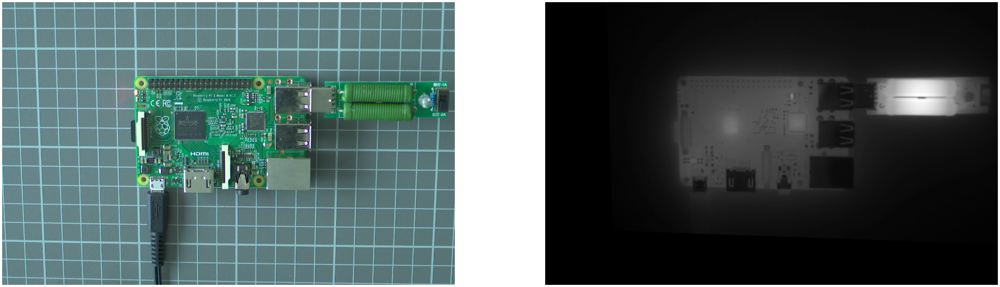

In [ ]:
plot_images(img, warped_normalized_temps)

Using the range of **real temperatures**, create a binary mask that will encompass the **entire Raspberry Pi** without the connected USB resistors.

Warping the non-normalized thermal image to the RGB perspective.

In [ ]:
warped_temps = cv2.warpPerspective(temps, H, (img.shape[1], img.shape[0]))

Segment by temperature values using **segmentation_two_thresholds()**.

Number of contours: 1


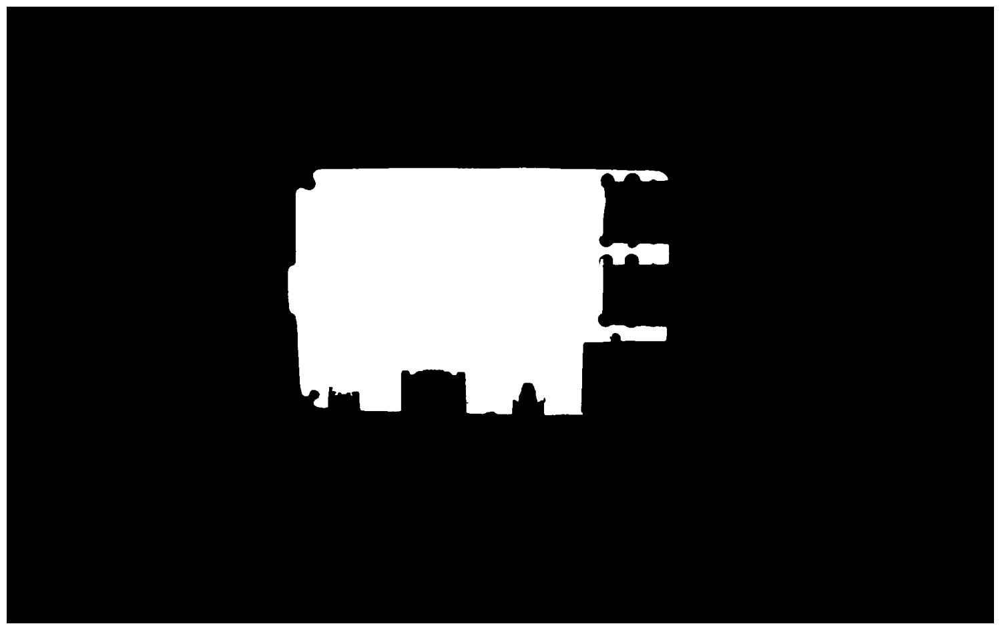

In [ ]:
mask = segmentation_two_thresholds(warped_temps, 36.5, 50)
warped_mask, num_of_contours, _ = find_contours(mask, 80000)
print(f"Number of contours: {num_of_contours}")
plot_images(warped_mask)

Using the previously created **binary mask**, segment the **temperature data**. Then, display them using a selected [JET colormap](https://docs.opencv.org/3.2.0/d3/d50/group__imgproc__colormap.html). As a partial output, **create a function** for **min-max normalization** of image temperature values, taking **min, max, newmin, newmax** as input. This function will be useful when applying the colormap.

For writing min-max normalization, we will use the following formula:

![min_max_normalization](images/min-max-normalization.png)

In [ ]:
# Min-max normalization
def min_max_norm(image, old_min, old_max, new_min, new_max):
    normalized_image = (image - old_min) * (new_max - new_min) / (old_max - old_min) + new_min
    normalized_image = np.clip(normalized_image, 0, 255)
    return normalized_image.astype(np.uint8) 

We will use only the temperature data of the chip. To do this, let's find the minimum and maximum chip temperature.

In [ ]:
segmented_temps = apply_mask(warped_temps, warped_mask)
print(np.unique(segmented_temps))
print(f"Minimum chip temperature: {np.unique(segmented_temps)[1]:.2f}")
print(f"Maximum chip temperature: {np.max(segmented_temps):.2f}")

[0.000 32.906 32.943 ... 48.740 48.741 48.774]
Minimum chip temperature: 32.91
Maximum chip temperature: 48.77


In [ ]:
old_min = np.unique(segmented_temps)[1]
old_max = np.max(segmented_temps)

Application of a colormap.

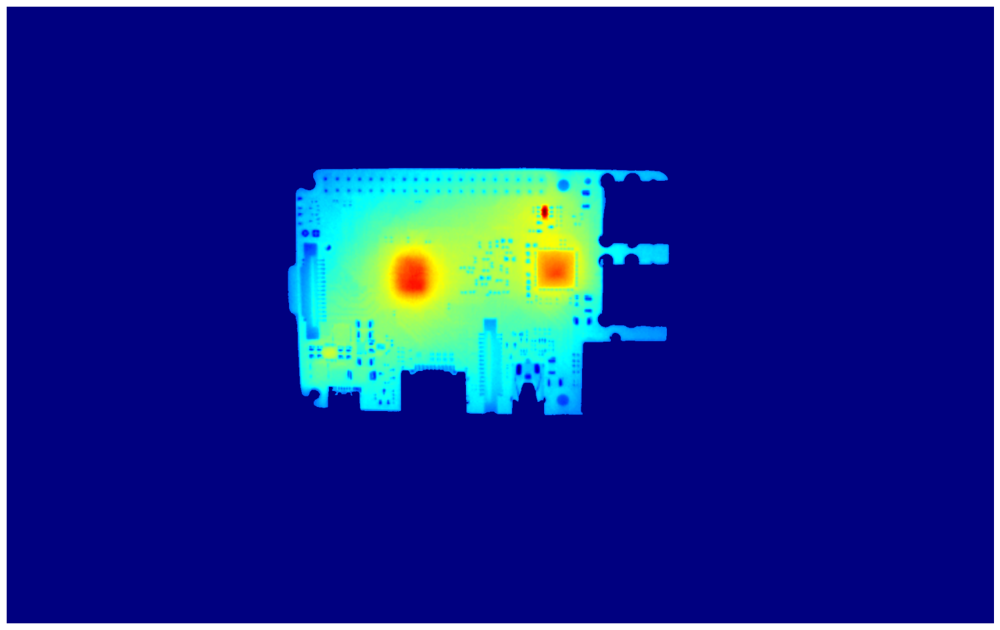

In [ ]:
normalized_segmented_temps = min_max_norm(segmented_temps, old_min, old_max, 0, 255)
color_temps = cv2.applyColorMap(to_3_channels(normalized_segmented_temps), cv2.COLORMAP_JET)
plot_images(color_temps)

Find the background color in the colormap.

In [ ]:
color_temps[0, 0]

array([128,   0,   0], dtype=uint8)

Let's write a function for merging images.

In [ ]:
def merge_images(basic_img, img_to_merge):
    if basic_img.shape != img_to_merge.shape:
        raise ValueError("Images must be the same size.")

    merged_img = basic_img.copy()
    for x in range(basic_img.shape[0]):
        for y in range(basic_img.shape[1]):
            if not np.array_equal(img_to_merge[x, y], [128, 0, 0]):
                merged_img[x, y] = img_to_merge[x, y]

    return merged_img

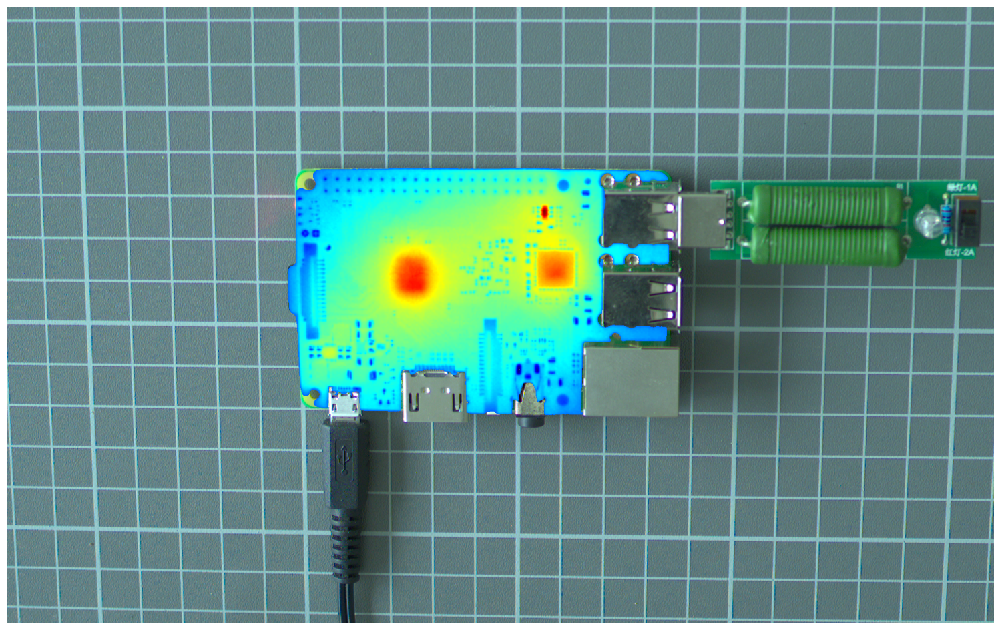

In [ ]:
merged_img = merge_images(img, color_temps)
plot_images(merged_img)

Alternatively, we can try merging photos using **cv2.bitwise_or()**.

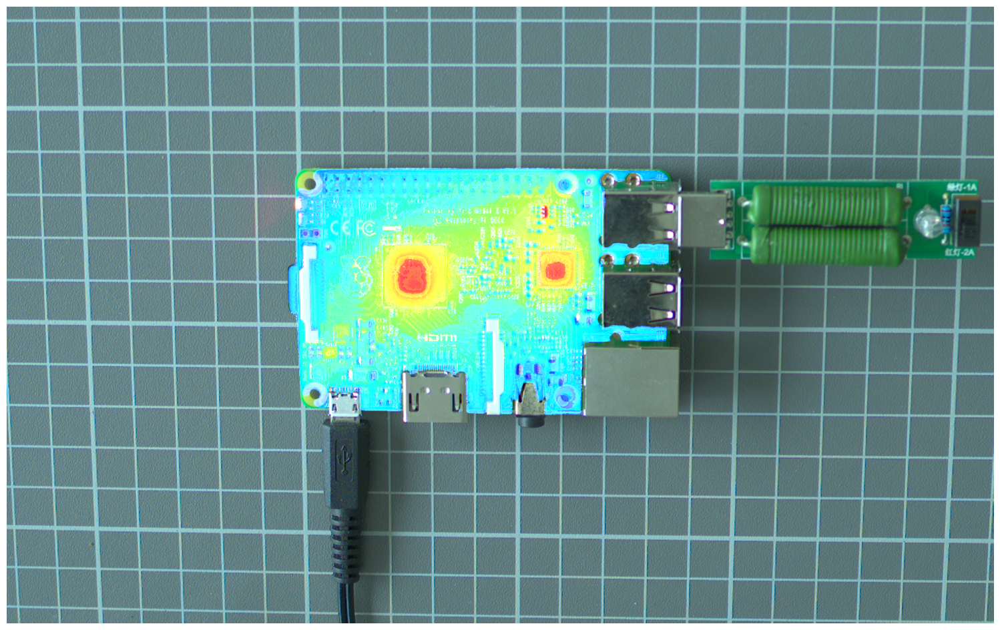

In [ ]:
plot_images(cv2.bitwise_or(img, apply_mask(color_temps, warped_mask)))

Utilize the temperature data to segment only the **2 heating components** - microchips. We are interested in the area with a temperature higher than **43 °C**. When searching for them, we will **use** the information that the sought microchips have approximately a square shape. Then, find their dimensions and area in pixels. Converting to real units is then not a complicated task.

Segment by temperature values using **segmentation_two_thresholds()**.

Number of contours: 2


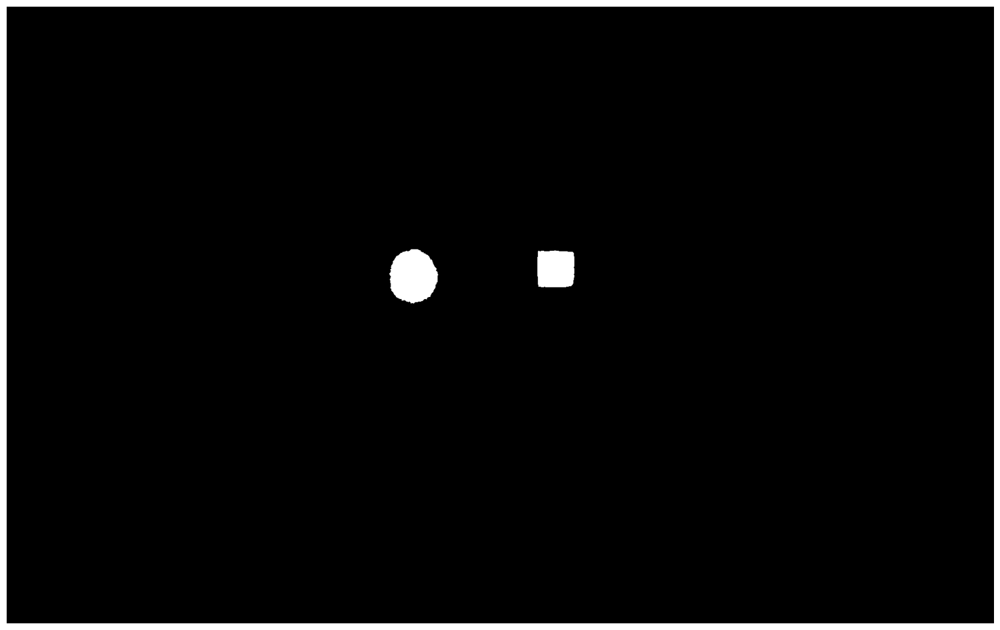

In [ ]:
mask = segmentation_two_thresholds(warped_temps, 43, 50)
contours_mask, num_of_contours, contours = find_contours(mask, 2000, 8000)
print(f"Number of contours: {num_of_contours}")
plot_images(contours_mask)

In [ ]:
rect1 = cv2.minAreaRect(contours[0])
ref_width_image1, ref_height_image1 = rect1[1]
print(f"Size in pixels: {(ref_width_image1, ref_height_image1)}")
print(f"Square in pixels^2: {ref_width_image1 * ref_height_image1}")

Size in pixels: (71.0, 71.0)
Square in pixels^2: 5041.0


In [ ]:
rect2 = cv2.minAreaRect(contours[1])
ref_width_image2, ref_height_image2 = rect2[1]
print(f"Size in pixels: {(ref_width_image2, ref_height_image2)}")
print(f"Square in pixels^2: {ref_width_image2 * ref_height_image2}")

Size in pixels: (94.577392578125, 103.63358306884766)
Square in pixels^2: 9801.394070180133


That's all!